In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [15, 10]

(<AxesSubplot:title={'center':'Inversed'}>,
 Text(0.5, 1.0, 'Inversed'))

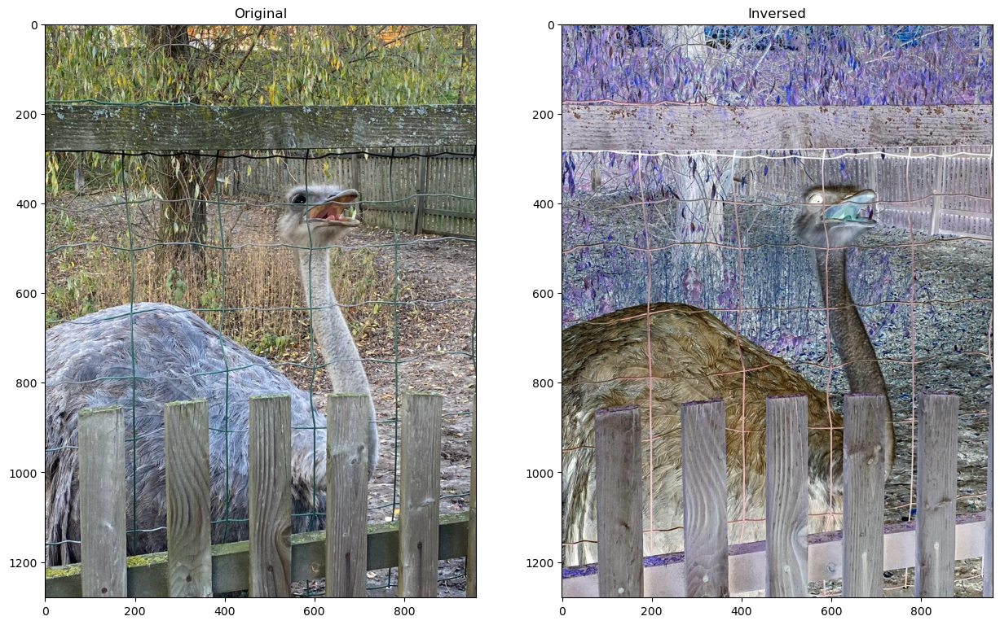

In [2]:
img = cv2.imread('pic.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.subplot(121), plt.imshow(img), plt.title('Original')
plt.subplot(122), plt.imshow(255-img), plt.title('Inversed')

(<AxesSubplot:title={'center':'Red+100'}>,
 Text(0.5, 1.0, 'Red+100'))

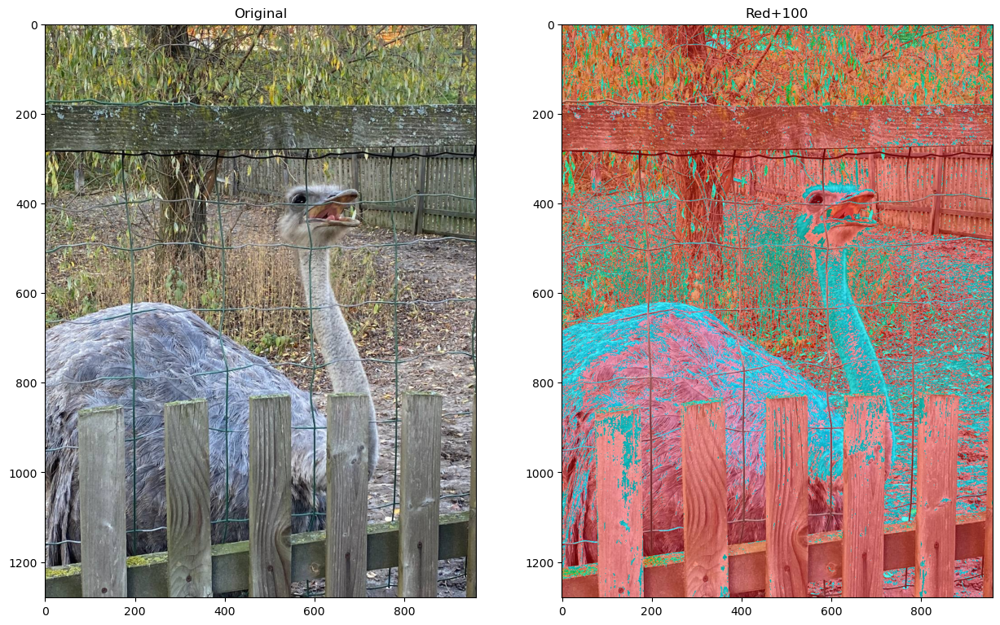

In [3]:
new=img.copy()
new[:, :, 0] = np.clip(img[:, :, 0] + 100, 0, 255)
plt.subplot(121), plt.imshow(img), plt.title('Original')
plt.subplot(122), plt.imshow(new), plt.title('Red+100')


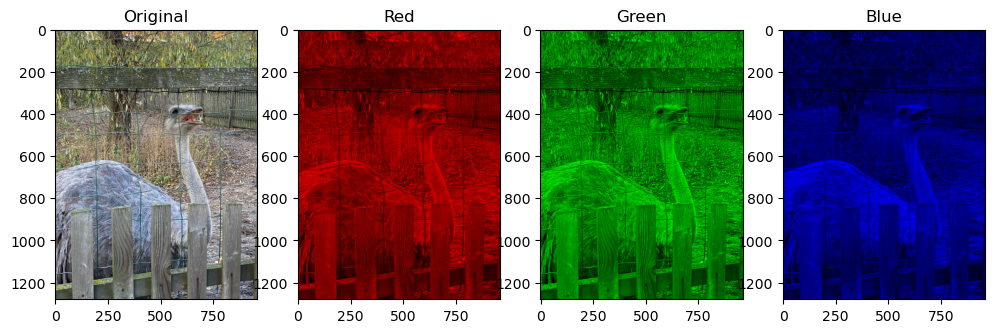

In [4]:
r, g, b = cv2.split(img)

fig, axs = plt.subplots(1, 4, figsize=(12, 4))

axs[0].imshow(img)
axs[0].set_title('Original')

axs[1].imshow(cv2.merge([r, np.zeros_like(g), np.zeros_like(b)]))
axs[1].set_title('Red')

axs[2].imshow(cv2.merge([np.zeros_like(r), g, np.zeros_like(b)]))
axs[2].set_title('Green')

axs[3].imshow(cv2.merge([np.zeros_like(r), np.zeros_like(g), b]))
axs[3].set_title('Blue')

plt.show()

Text(0.5, 1.0, 'result_img')

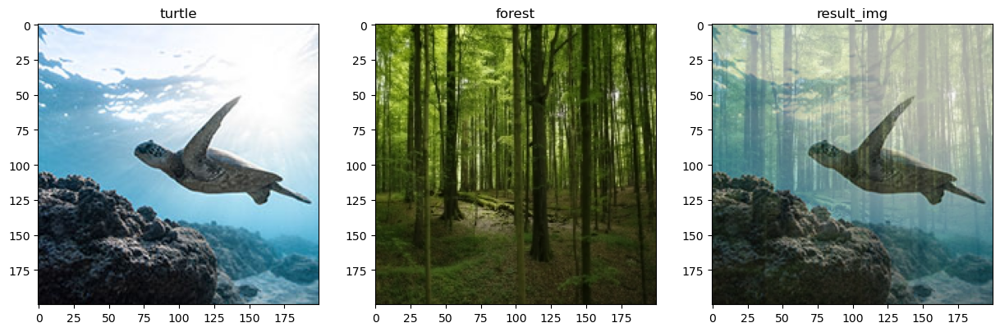

In [5]:
forest = cv2.imread('200xforest.jpg')
forest = cv2.cvtColor(forest, cv2.COLOR_BGR2RGB)

turtle = cv2.imread('200xturtl.jpeg')
turtle = cv2.cvtColor(turtle, cv2.COLOR_BGR2RGB)

result_img=cv2.addWeighted(turtle, .65, forest, .35, 0)



fig, axs = plt.subplots(1, 3)

axs[0].imshow(turtle)
axs[0].set_title('turtle')

axs[1].imshow(forest)
axs[1].set_title('forest')

axs[2].imshow(result_img)
axs[2].set_title('result_img')



In [6]:
def gaussian_kernel(size, sigma=1):
    kernel = np.fromfunction(
        lambda x, y: (1/ (2 * np.pi * sigma ** 2)) * np.exp(- ((x - size // 2) ** 2 + (y - size // 2) ** 2) / (2 * sigma ** 2)),
        (size, size)
    )
    return kernel / np.sum(kernel)

gaussian_kernel(3,10)

array([[0.11074074, 0.11129583, 0.11074074],
       [0.11129583, 0.1118537 , 0.11129583],
       [0.11074074, 0.11129583, 0.11074074]])

In [7]:
from scipy import ndimage


puppies = cv2.imread('puppy.jpg')
puppies = cv2.cvtColor(puppies, cv2.COLOR_BGR2RGB)

blurred=ndimage.convolve(puppies.astype('float32'), gaussian_kernel(5,10)[..., np.newaxis]).clip(0,255).astype('uint8')

blurred_cv = cv2.GaussianBlur(puppies, (5,5), 10)

Text(0.5, 1.0, 'Blurred puppies CV2')

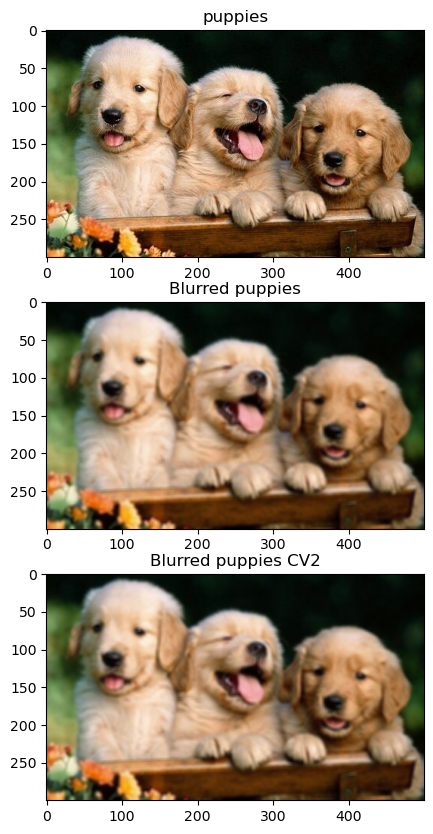

In [8]:
plt.subplot(311)
plt.imshow(puppies)
plt.title(f'puppies')
    
plt.subplot(312)
plt.imshow(blurred)
plt.title('Blurred puppies')

plt.subplot(313)
plt.imshow(blurred_cv)
plt.title('Blurred puppies CV2')

In [9]:
sharp_filter = np.array([[-1, -1, -1],
                           [-1,  9, -1],
                           [-1, -1, -1]])

sharpen = ndimage.convolve(puppies.astype('float32'), sharp_filter[..., np.newaxis]).clip(0,255).astype('uint8')
sharpen_cv = cv2.filter2D(puppies, -1, sharp_filter)

Text(0.5, 1.0, 'sharpen_cv CV2')

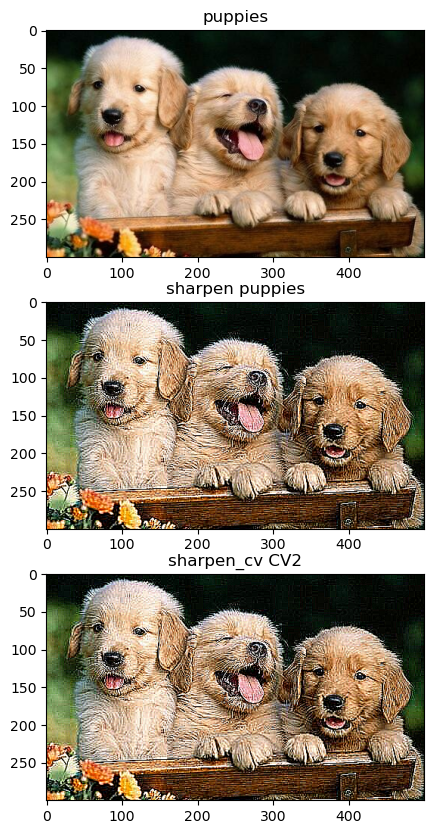

In [10]:
plt.subplot(311)
plt.imshow(puppies)
plt.title(f'puppies')
    
plt.subplot(312)
plt.imshow(sharpen)
plt.title('sharpen puppies')

plt.subplot(313)
plt.imshow(sharpen_cv)
plt.title('sharpen_cv CV2')

In [11]:
def median_filter(image, kernel_size):
    result = np.zeros_like(image)
    padding = kernel_size // 2
    for c in range(image.shape[2]):
        for i in range(padding, image.shape[0] - padding):
            for j in range(padding, image.shape[1] - padding):
                
                
                neighborhood = image[i - padding:i + padding + 1, j - padding:j + padding + 1, c]

                
                result[i, j, c] = np.median(neighborhood)

    return result



Text(0.5, 1.0, 'median_filtered_cv CV2')

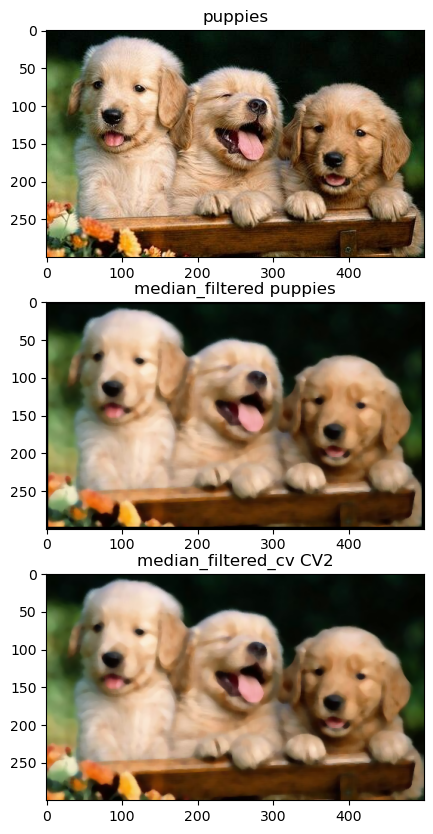

In [12]:
median_filtered = median_filter(puppies, 7)

median_filtered_cv = cv2.medianBlur(puppies, 7)


plt.subplot(311)
plt.imshow(puppies)
plt.title(f'puppies')
    
plt.subplot(312)
plt.imshow(median_filtered)
plt.title('median_filtered puppies')

plt.subplot(313)
plt.imshow(median_filtered_cv)
plt.title('median_filtered_cv CV2')

In [13]:
def erosion(image, kernel):
    result = np.zeros_like(image, dtype=np.uint8)
    padding = kernel.shape[0] // 2

    for c in range(image.shape[2]):
        for i in range(padding, image.shape[0] - padding):
            for j in range(padding, image.shape[1] - padding):
                neighborhood = image[i - padding:i + padding + 1, j - padding:j + padding + 1, c]
                result[i, j, c] = np.min(neighborhood)

    return result

Text(0.5, 1.0, 'erosion_filtered_cv CV2')

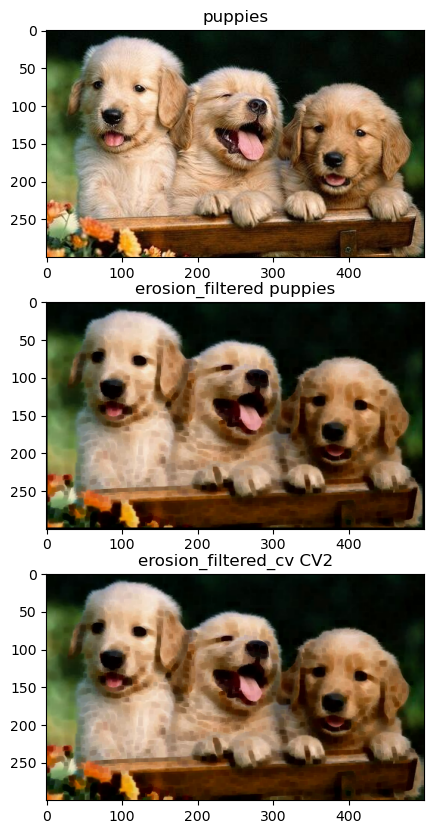

In [14]:
kernel = np.ones((5, 5), np.uint8)
erosion_filtered = erosion(puppies, kernel)

erosion_filtered_cv=cv2.erode(puppies, kernel)

plt.subplot(311)
plt.imshow(puppies)
plt.title(f'puppies')
    
plt.subplot(312)
plt.imshow(erosion_filtered)
plt.title('erosion_filtered puppies')

plt.subplot(313)
plt.imshow(erosion_filtered_cv)
plt.title('erosion_filtered_cv CV2')

In [15]:
def dilation(image, kernel):
    result = np.zeros_like(image, dtype=np.uint8)
    padding = kernel.shape[0] // 2

    for c in range(image.shape[2]):
        for i in range(padding, image.shape[0] - padding):
            for j in range(padding, image.shape[1] - padding):
                neighborhood = image[i - padding:i + padding + 1, j - padding:j + padding + 1, c]
                result[i, j, c] = np.max(neighborhood)

    return result



Text(0.5, 1.0, 'dilation_result_сv CV2')

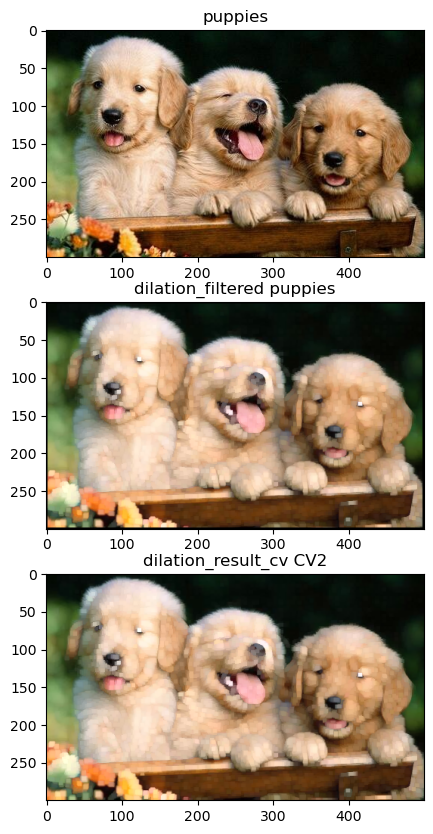

In [16]:
kernel = np.ones((5, 5), np.uint8)
dilation_filtered = dilation(puppies, kernel)

dilation_result_сv = cv2.dilate(puppies, kernel)

plt.subplot(311)
plt.imshow(puppies)
plt.title(f'puppies')
    
plt.subplot(312)
plt.imshow(dilation_filtered)
plt.title('dilation_filtered puppies')

plt.subplot(313)
plt.imshow(dilation_result_сv)
plt.title('dilation_result_сv CV2')

In [17]:
def sobel_filter_custom(img):
    sobel_x = np.array([[-1, 0, 1],
                        [-2, 0, 2],
                        [-1, 0, 1]])
    sobel_y = np.array([[-1, -2, -1],
                        [0, 0, 0],
                        [1, 2, 1]])
    
    grad_x = ndimage.convolve(img, sobel_x).clip(0,255)
    grad_y = ndimage.convolve(img, sobel_y).clip(0,255)
    
    gradient = np.sqrt(grad_x ** 2 + grad_y ** 2)    
    return gradient.astype(np.uint8)


def sobel_filter_cv2(img):
    sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)
    
    sobel_x = cv2.convertScaleAbs(sobel_x)
    sobel_y = cv2.convertScaleAbs(sobel_y)
    
    gradient = np.sqrt(sobel_x ** 2 + sobel_y ** 2)

    
    return gradient.astype(np.uint8)



Text(0.5, 1.0, 'dilation_result_сv CV2')

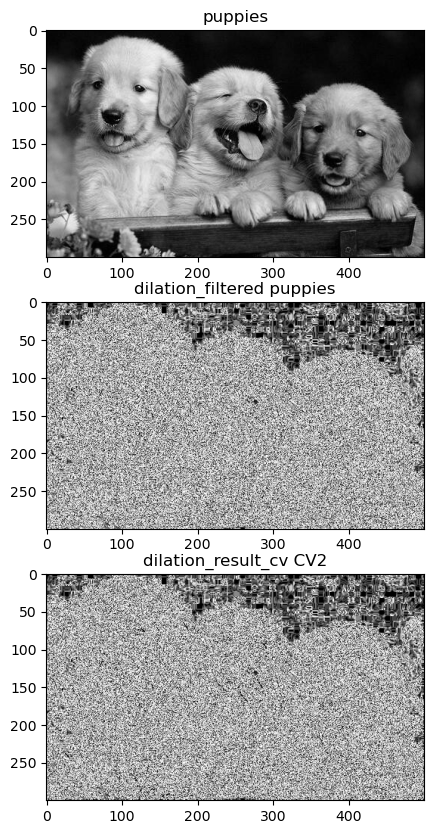

In [20]:
puppies_gray = cv2.cvtColor(puppies,cv2.COLOR_BGRA2GRAY)
sobel = sobel_filter_custom(puppies_gray)
sobel_cv2 = sobel_filter_cv2(puppies_gray)

plt.subplot(311)
plt.imshow(puppies_gray, cmap="gray")
plt.title(f'puppies')
    
plt.subplot(312)
plt.imshow(sobel, cmap="gray")
plt.title('dilation_filtered puppies')

plt.subplot(313)
plt.imshow(sobel_cv2, cmap="gray")
plt.title('dilation_result_сv CV2')

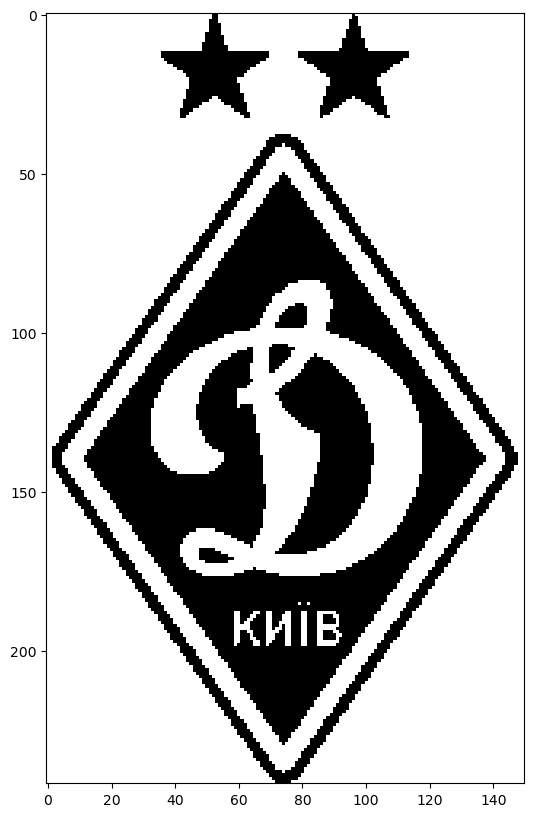

In [23]:
watermark = cv2.imread('4216.750x0.jpg',cv2.IMREAD_GRAYSCALE)
watermark = cv2.threshold(watermark, 127, 255, cv2.THRESH_BINARY)[1]
plt.imshow(watermark, cmap = "gray")

In [24]:
puppies.shape

(300, 500, 3)

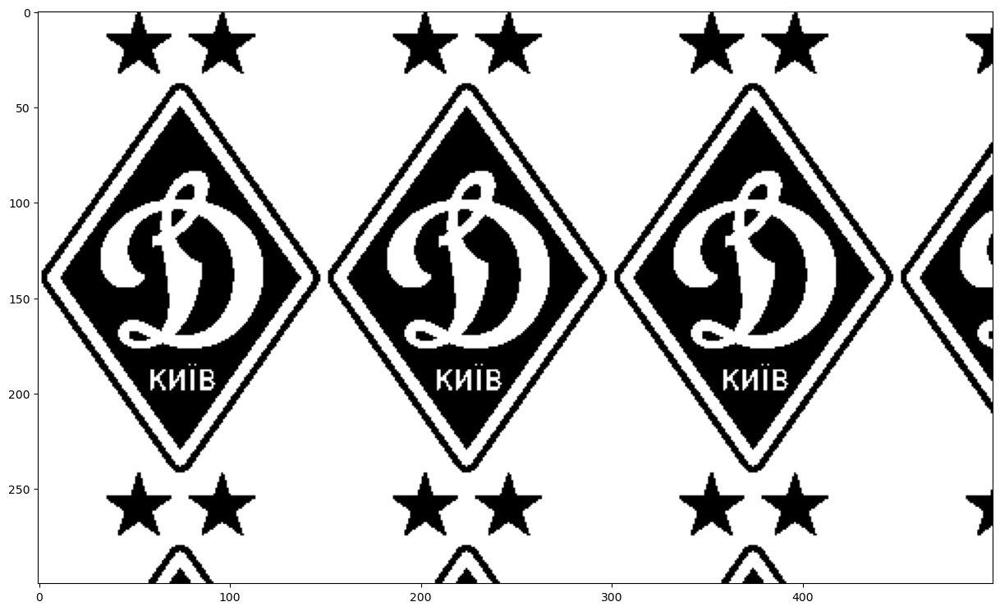

In [26]:
new_height, new_width = 300, 500

num_rows = new_height // watermark.shape[0] + 1
num_cols = new_width // watermark.shape[1] + 1

watermark = np.tile(watermark, (num_rows, num_cols))[:new_height, :new_width]
plt.imshow(watermark, cmap = "gray")

In [28]:
def int2bitarray(img):
    arr = []
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            arr.append(np.binary_repr(img[i][j], width=8))
    return arr
arr = np.array(int2bitarray(puppies[:,:,2]))
arr = arr.reshape(puppies[:,:,2].shape)

plates = []
for k in range(0,8):
    plane = np.zeros((puppies[:,:,2].shape))
    for i in range(arr.shape[0]):
        for j in range(arr.shape[1]):
            plane[i,j]=int(arr[i,j][k])
    plates.append(plane)

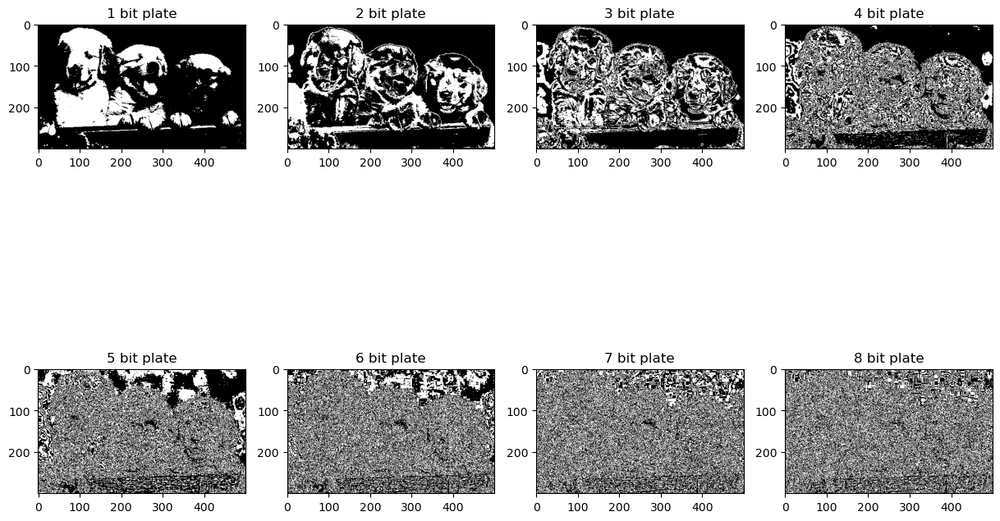

In [30]:
for plate in range (0, len(plates)):
    plt.subplot(2, 4, plate+1)
    plt.imshow(plates[plate], cmap="gray")
    plt.title(f'{plate+1} bit plate')

In [32]:
plates_watermark = []

for bit in range(0,8):
    puppies_watermark = puppies.copy()

    puppies_watermark[:, :, 2] = np.where(watermark == 255, puppies_watermark[:, :, 2] | (1 << bit), puppies_watermark[:, :, 2] & ~(1 << bit))
    plates_watermark.append(puppies_watermark)

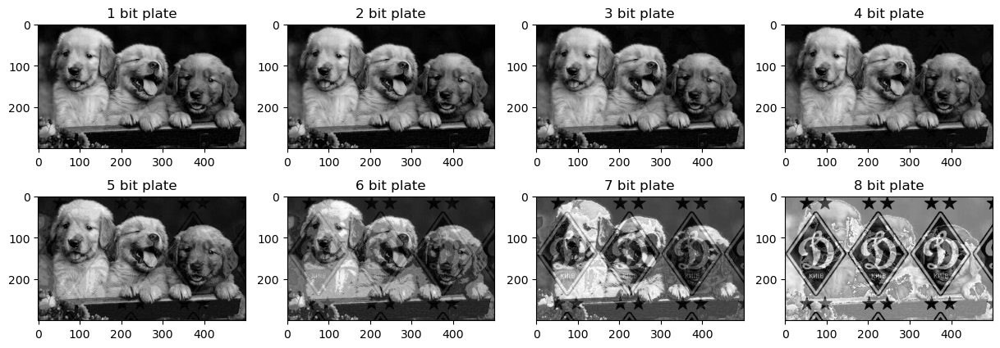

In [33]:
plt.rcParams['figure.figsize'] = [15, 5]

for plate in range (0, len(plates_watermark)):
    plt.subplot(2, 4, plate+1)
    plt.imshow(plates_watermark[plate][:, :, 2], cmap="gray")
    plt.title(f'{plate+1} bit plate')